## <font color='Green'>In this notebook, we will walk through complete machine learning problem steps to predict energy score </font>

Based upon given data, we need to predict the energy star score of building.

This problem can be solved using 2 ways.

#### <font color='Green'> 1) Using Regression type </font>   
#### <font color='Green'> 2) Using classification type </font>  - Can be converted enegry star score to given class of ppt


Workflow for predicting energy star score

1) Data cleaning and formatting  
2) Exploratory data analysis  (Use Pandas profilling to get basic idea about dataset)  
3) Feature engineering and selection  
4) machine learning models  
5) Predictions   

conclusion based upin given data set


In [102]:
# import libraries

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
pd.options.mode.chained_assignment = None
pd.set_option('display.max_columns', 60)
plt.rcParams['font.size'] = 24
sns.set(font_scale = 2) 
%matplotlib inline
from IPython.core.pylabtools import figsize

from os.path import expanduser
import os, sys, datetime, math

import warnings
warnings.filterwarnings("ignore")
from IPython.core.pylabtools import figsize

#### <font color='Green'>  Load data set </font>

In [103]:
# import data set 
HOME_PATH = expanduser("~")

LOCAL_FILE_PATH = HOME_PATH+'/ds_ml/jet/'

FILE_PATH  = LOCAL_FILE_PATH + 'Usecase1_Dataset.csv'

In [104]:
df = pd.read_csv(FILE_PATH)

In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11746 entries, 0 to 11745
Data columns (total 60 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Order                                                       11746 non-null  int64  
 1   Property Id                                                 11746 non-null  int64  
 2   Property Name                                               11746 non-null  object 
 3   Parent Property Id                                          11746 non-null  object 
 4   Parent Property Name                                        11746 non-null  object 
 5   BBL - 10 digits                                             11735 non-null  object 
 6   NYC Borough, Block and Lot (BBL) self-reported              11746 non-null  object 
 7   NYC Building Identification Number (BIN)                    11746 non-null  object 
 

In [106]:
df.head()

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
0,1,13286,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,Not Available,10017,675,3 AVENUE,Manhattan,289356.0,Office,Office,Office,293447,Not Available,Not Available,Not Available,Not Available,1963,2,100,Whole Building,Not Available,Not Available,305.6,303.1,37.8,Not Available,614.2,Not Available,Not Available,Not Available,Not Available,Not Available,5.15506751E7,Not Available,Not Available,38139374.2,1.10827705E7,6962.2,0,6962.2,762051,Not Available,Not Available,619.4,05/01/2017 05:32:03 PM,No,In Compliance,40.750791,-73.973963,6.0,4.0,88.0,Turtle Bay-East Midtown ...
1,2,28400,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,Not Available,10032,180,FT WASHINGTON AVENUE,Manhattan,3693539.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181,Not Available,Not Available,Not Available,Not Available,1969,12,100,Whole Building,Whole Building,55,229.8,228.8,24.8,2.4,401.1,Not Available,1.96248472E7,Not Available,Not Available,Not Available,-3.914148026E8,933073441,9330734.4,332365924,9.62613121E7,55870.4,51016.4,4854.1,3889181,Not Available,Not Available,404.3,04/27/2017 11:23:27 AM,No,In Compliance,40.841402,-73.942568,12.0,10.0,251.0,Washington Heights South ...
2,3,4778226,MSCHoNY North,28400,NYP Columbia (West Campus),1021380030,1-02138-0030,1063380,3975 Broadway,Not Available,10032,3975,BROADWAY,Manhattan,152765.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),231342,Not Available,Not Available,Not Available,Not Available,1924,1,100,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,231342,Not Available,Not Available,Not Available,04/27/2017 11:23:27 AM,No,In Compliance,40.840427,-73.940249,12.0,10.0,251.0,Washington Heights South ...
3,4,4778267,Herbert Irving Pavilion & Millstein Hospital,28400,NYP Columbia (West Campus),1021390001,1-02139-0001,1087281; 1076746,161 Fort Washington Ave,177 Fort Washington Ave,10032,161,FT WASHINGTON AVENUE,Manhattan,891040.0,Hos

In [107]:
df['DOF Benchmarking Submission Status'].value_counts()

In Compliance    11716
Name: DOF Benchmarking Submission Status, dtype: int64

In [108]:
# select only not null data points
df = df[df['ENERGY STAR Score'].notnull()]

 #### <font color='Green'> Use pandas profilling to get detail idea about dataset </font>

In [109]:
# Create overview of the variables
import pandas_profiling as pf
pf.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [110]:
# describe 
df.describe(include='all')

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Weather Normalized Source EUI (kBtu/ft²),Fuel Oil #1 Use (kBtu),Fuel Oil #2 Use (kBtu),Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA
count,11746.000000,1.174600e+04,11746,11746,11746,11735,11746,11746,11746,11746,11746,11622,11624,11628,1.162800e+04,11746,11746,11746,11746,11746,11746,11746,11746,11746.000000,11746.000000,11746.000000,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,11746,1.174600e+04,11746,11746,11746,11746,11628,11716,9483.000000,9483.000000,9483.000000,9483.000000,9483.000000,9483
unique,NaN,NaN,11740,102,103,11580,11582,11508,11645,177,286,4198,2024,5,NaN,55,813,54,9484,59,2264,50,964,NaN,NaN,NaN,8,7,101,1959,1944,441,66,2795,10,1906,1180,259,15,927,10155,9632,11406,10879,7818,5968,5853,NaN,7230,5607,2920,3537,2,1,NaN,NaN,NaN,NaN,NaN,144
top,NaN,NaN,Clinton West Condominium,Not Applicable: Standalone Property,Not Applicable: Standalone Property,1019730001,1019730001,Not Available,410 West 118th Street,Not Available,10022,1,BROADWAY,Manhattan,NaN,Multifamily Housing,Multifamily Housing,Multifamily Housing,70000,Not Available,Not Available,Not Available,Not Available,NaN,NaN,NaN,Whole Building,Whole Building,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,Not Available,0,0,0,NaN,Not Available,Not Available,Not Available,05/01/2017 02:58:14 PM,Yes,In Compliance,NaN,NaN,NaN,NaN,NaN,Midtown-Midtown South ...
freq,NaN,NaN,2,11324,11324,26,26,162,12,11539,269,66,390,5176,NaN,8688,6182,8694,61,8005,8005,10262,10262,NaN,NaN,NaN,11648,7111,2104,163,1465,787,1963,1465,11737,9165,10425,11152,11730,10810,1442,1962,244,786,108,892,194,NaN,3984,3984,163,1258,7552,11716,NaN,NaN,NaN,NaN,NaN,720
mean,7185.759578,3.642958e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.732695e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1948.738379,1.289971,98.762557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.673739e+05,NaN,NaN,NaN,NaN,NaN,NaN,40.754379,-73.957057,7.140673,15.771275,4977.596647,NaN
std,4323.859984,1.049070e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.367055e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.576386,4.017484,7.501603,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.189238e+05,NaN,NaN,NaN,NaN,NaN,NaN,0.080120,0.046337,3.954129,15.674375,13520

In [111]:
# count missing value 

def missing_values_in_each_column(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * mis_val / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        mis_val_table_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        mis_val_table_columns = mis_val_table_columns[
            mis_val_table_columns.iloc[:,1] != 0].sort_values('% of Total Values', ascending=False).round(1)
        
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_columns.shape[0]) +
              " columns that have missing values.")
        
        return mis_val_table_columns

In [112]:
missing_values_in_each_column(df) 

Your selected dataframe has 60 columns.
There are 13 columns that have missing values.


,Missing Values,% of Total Values
Latitude,2263,19.3
Longitude,2263,19.3
Community Board,2263,19.3
Council District,2263,19.3
Census Tract,2263,19.3
NTA,2263,19.3
Street Number,124,1.1
Street Name,122,1.0
Borough,118,1.0
DOF Gross Floor Area,118,1.0


In [113]:
# replace 
df = df.replace({'Not Available': np.nan})

# convert these columns into float datatype if contain below str
for col in list(df.columns):
    if ('ft' in col or 'kBtu' in col or 'Metric Tons CO2e' in col or 'kWh' in 
        col or 'therms' in col or 'gal' in col or 'Score' in col):
        df[col] = df[col].astype(float) 

In [114]:
def missing_values_in_each_column(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * mis_val / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        mis_val_table_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        mis_val_table_columns = mis_val_table_columns[
            mis_val_table_columns.iloc[:,1] != 0].sort_values('% of Total Values', ascending=False).round(1)
        
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_columns.shape[0]) +
              " columns that have missing values.")
        
        return mis_val_table_columns

In [115]:
missing_values_in_each_column(df)

Your selected dataframe has 60 columns.
There are 46 columns that have missing values.


,Missing Values,% of Total Values
Fuel Oil #1 Use (kBtu),11737,99.9
Diesel #2 Use (kBtu),11730,99.9
Address 2,11539,98.2
Fuel Oil #5 & 6 Use (kBtu),11152,94.9
District Steam Use (kBtu),10810,92.0
Fuel Oil #4 Use (kBtu),10425,88.8
3rd Largest Property Use Type - Gross Floor Area (ft²),10262,87.4
3rd Largest Property Use Type,10262,87.4
Fuel Oil #2 Use (kBtu),9165,78.0
2nd Largest Property Use Type,8005,68.2


In [116]:
missing_data = missing_values_in_each_column(df);
missing_columns = list(missing_data[missing_data['% of Total Values'] > 50].index)
print('Remove %d columns.' % len(missing_columns)) 

Your selected dataframe has 60 columns.
There are 46 columns that have missing values.
Remove 11 columns.


### <font color='Green'> Some conclusion based upon data set: </font>

* 'NYC Borough, Block and Lot (BBL) self-reported' is equal to 'BBL - 10 digits', where the first digit represents the 'Borough', next five digits 'Tax Block' and last four 'Tax Lot', plus we have already a 'Borough' column in the dataset. -- Since there are only two missing values at 'BBL - 10 digits'


*  'Address 1 (self-reported)', 'Address 2', 'Postal Code','Street Name', 'Street Number','Latitude' and 'Longitude' contain information about the localization.

    I'll keep only 'Postal Code' as it seems to be the most generic information about it
    
    

* 'Total GHG Emissions (Metric Tons CO2e)'='Direct GHG Emissions (Metric Tons CO2e)'+'Indirect GHG Emissions (Metric Tons CO2e)' --- I'll keep the total and the fraction of direct


*  'Property GFA - Self-Reported (ft²)'='DOF Gross Floor Area', so I'll drop the 'DOF Gross Floor Area' that has missing values


*  'Largest Property Use Type - Gross Floor Area (ft²)','2nd Largest Property Use - Gross Floor Area (ft²)' and '3rd Largest Property Use Type - Gross Floor Area (ft²)' are part of 'Property GFA - Self-Reported (ft²)'-- I'll create and keep the fractions they represent and drop the original values



In [117]:
df['Largest Property Use Rate'] = df['Largest Property Use Type - Gross Floor Area (ft²)']/df['Property GFA - Self-Reported (ft²)']
df['2nd Property Use Rate'] = df['2nd Largest Property Use - Gross Floor Area (ft²)']/df['Property GFA - Self-Reported (ft²)']
df['3rd Property Use Rate'] = df['3rd Largest Property Use Type - Gross Floor Area (ft²)']/df['Property GFA - Self-Reported (ft²)']
df['Direct GHG Emissions Rate'] = df['Direct GHG Emissions (Metric Tons CO2e)']/df['Total GHG Emissions (Metric Tons CO2e)']
df['BBL - 10 digits'] = df['BBL - 10 digits'].str.extract('(\d+)', expand=False)
df['Borough'] = df['BBL - 10 digits'].str[0]
df['Tax Block'] = df['BBL - 10 digits'].str[1:6]
df['Tax Lot'] = df['BBL - 10 digits'].str[6:10]
df['Postal Code'] = df['Postal Code'].astype(str)
df['Year Built'] = df['Year Built'].astype(str)
df['Borough'] = df['Borough'].astype(str)
df['Tax Block'] = df['Tax Block'].astype(str)
df['Tax Lot'] = df['Tax Lot'].astype(str)
df['Property Id'] = df['Property Id'].astype(str)

In [118]:
df.head()

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),...,Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA,Largest Property Use Rate,2nd Property Use Rate,3rd Property Use Rate,Direct GHG Emissions Rate,Tax Block,Tax Lot
0,1,13286,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,NaN,10017,675,3 AVENUE,1,289356.0,Office,Office,Office,293447.0,NaN,NaN,NaN,NaN,1963,2,100,Whole Building,NaN,NaN,305.6,...,NaN,NaN,NaN,51550675.1,NaN,NaN,38139374.2,11082770.5,6962.2,0.0,6962.2,762051.0,NaN,NaN,619.4,05/01/2017 05:32:03 PM,No,In Compliance,40.750791,-73.973963,6.0,4.0,88.0,Turtle Bay-East Midtown ...,0.385075,NaN,NaN,0.00000,01316,0001
1,2,28400,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,NaN,10032,180,FT WASHINGTON AVENUE,1,3693539.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181.0,NaN,NaN,NaN,NaN,1969,12,100,Whole Building,Whole Building,55.0,229.8,...,NaN,NaN,NaN,-391414802.6,933073441.0,9330734.4,332365924.0,96261312.1,55870.4,51016.4,4854.1,3889181.0,NaN,NaN,404.3,04/27/2017 11:23:27 AM,No,In Compliance,40.841402,-73.942568,12.0,10.0,251.0,Washington Heights South ...,1.000000,NaN,NaN,0.91312,02138,0040
2,3,4778226,MSCHoNY North,28400,NYP Columbia (West Campus),1021380030,1-02138-0030,1063380,3975 Broadway,NaN,10032,3975,BROADWAY,1,152765.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),231342.0,NaN,NaN,NaN,NaN,1924,1,100,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,231342.0,NaN,NaN,NaN,04/27/2017 11:23:27 AM,No,In Compliance,40.840427,-73.940249,12.0,10.0,251.0,Washington Heights South ...,1.000000,NaN,NaN,NaN,02138,0030
3,4,4778267,Herbert Irving Pavilion & Millstein Hospital,28400,NYP Columbia (West Campus),1021390001,1-02139-0001,1087281; 1076746,161 Fort Washington Ave,177 Fort Washington Ave,10032,161,FT WASHINGTON AVENUE,1,891040.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),1305748.0,NaN,NaN,NaN,NaN,1971,1,100,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1305748.0,NaN,NaN,NaN,04/27/2017 11:23:27 AM,No,In Compliance,40.840746,-73.942854,12.0,10.0,255.0,Washington Heights South ...,1.000000,NaN,NaN,NaN,02139,0001
4,5,4778288,Neuro Institute,28400,NYP Columbia (West Campus),1021390085,1-02139-0085,1063403,710 West 168th Street,NaN,10032,193,FT WASHINGTON AVENUE,1,211400.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),17969

In [119]:
missing_values_in_each_column(df)

Your selected dataframe has 66 columns.
There are 49 columns that have missing values.


,Missing Values,% of Total Values
Fuel Oil #1 Use (kBtu),11737,99.9
Diesel #2 Use (kBtu),11730,99.9
Address 2,11539,98.2
Fuel Oil #5 & 6 Use (kBtu),11152,94.9
District Steam Use (kBtu),10810,92.0
Fuel Oil #4 Use (kBtu),10425,88.8
3rd Largest Property Use Type,10262,87.4
3rd Property Use Rate,10262,87.4
3rd Largest Property Use Type - Gross Floor Area (ft²),10262,87.4
Fuel Oil #2 Use (kBtu),9165,78.0


#### <font color='Green'> We still have a lot of missing values, convet these values into zero & then we will remove those column which have unuseful information </font>

In [120]:
# We still have a lot of missing values, convet these values into zero & then we will remove those column which have unuseful information

zero_col = ['2nd Property Use Rate','3rd Property Use Rate',
            'Water Intensity (All Water Sources) (gal/ft²)','Weather Normalized Site Natural Gas Intensity (therms/ft²)',
            'Total GHG Emissions (Metric Tons CO2e)','Weather Normalized Site Electricity Intensity (kWh/ft²)',
            'Direct GHG Emissions Rate','Total GHG Emissions (Metric Tons CO2e)'
            ]

for col in zero_col:
    df[col].replace(np.nan, 0, inplace = True)

In [121]:
prop_col = ['2nd Largest Property Use Type','3rd Largest Property Use Type']

for col in prop_col:
    df[col].replace(np.nan, 'none', inplace = True)

In [122]:
df.head()

,Order,Property Id,Property Name,Parent Property Id,Parent Property Name,BBL - 10 digits,"NYC Borough, Block and Lot (BBL) self-reported",NYC Building Identification Number (BIN),Address 1 (self-reported),Address 2,Postal Code,Street Number,Street Name,Borough,DOF Gross Floor Area,Primary Property Type - Self Selected,List of All Property Use Types at Property,Largest Property Use Type,Largest Property Use Type - Gross Floor Area (ft²),2nd Largest Property Use Type,2nd Largest Property Use - Gross Floor Area (ft²),3rd Largest Property Use Type,3rd Largest Property Use Type - Gross Floor Area (ft²),Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),...,Fuel Oil #4 Use (kBtu),Fuel Oil #5 & 6 Use (kBtu),Diesel #2 Use (kBtu),District Steam Use (kBtu),Natural Gas Use (kBtu),Weather Normalized Site Natural Gas Use (therms),Electricity Use - Grid Purchase (kBtu),Weather Normalized Site Electricity (kWh),Total GHG Emissions (Metric Tons CO2e),Direct GHG Emissions (Metric Tons CO2e),Indirect GHG Emissions (Metric Tons CO2e),Property GFA - Self-Reported (ft²),Water Use (All Water Sources) (kgal),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,DOF Benchmarking Submission Status,Latitude,Longitude,Community Board,Council District,Census Tract,NTA,Largest Property Use Rate,2nd Property Use Rate,3rd Property Use Rate,Direct GHG Emissions Rate,Tax Block,Tax Lot
0,1,13286,201/205,13286,201/205,1013160001,1013160001,1037549,201/205 East 42nd st.,NaN,10017,675,3 AVENUE,1,289356.0,Office,Office,Office,293447.0,none,NaN,none,NaN,1963,2,100,Whole Building,NaN,NaN,305.6,...,NaN,NaN,NaN,51550675.1,NaN,NaN,38139374.2,11082770.5,6962.2,0.0,6962.2,762051.0,NaN,0.0,619.4,05/01/2017 05:32:03 PM,No,In Compliance,40.750791,-73.973963,6.0,4.0,88.0,Turtle Bay-East Midtown ...,0.385075,0.0,0.0,0.00000,01316,0001
1,2,28400,NYP Columbia (West Campus),28400,NYP Columbia (West Campus),1021380040,1-02138-0040,1084198; 1084387;1084385; 1084386; 1084388; 10...,622 168th Street,NaN,10032,180,FT WASHINGTON AVENUE,1,3693539.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),3889181.0,none,NaN,none,NaN,1969,12,100,Whole Building,Whole Building,55.0,229.8,...,NaN,NaN,NaN,-391414802.6,933073441.0,9330734.4,332365924.0,96261312.1,55870.4,51016.4,4854.1,3889181.0,NaN,0.0,404.3,04/27/2017 11:23:27 AM,No,In Compliance,40.841402,-73.942568,12.0,10.0,251.0,Washington Heights South ...,1.000000,0.0,0.0,0.91312,02138,0040
2,3,4778226,MSCHoNY North,28400,NYP Columbia (West Campus),1021380030,1-02138-0030,1063380,3975 Broadway,NaN,10032,3975,BROADWAY,1,152765.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),231342.0,none,NaN,none,NaN,1924,1,100,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,231342.0,NaN,0.0,NaN,04/27/2017 11:23:27 AM,No,In Compliance,40.840427,-73.940249,12.0,10.0,251.0,Washington Heights South ...,1.000000,0.0,0.0,0.00000,02138,0030
3,4,4778267,Herbert Irving Pavilion & Millstein Hospital,28400,NYP Columbia (West Campus),1021390001,1-02139-0001,1087281; 1076746,161 Fort Washington Ave,177 Fort Washington Ave,10032,161,FT WASHINGTON AVENUE,1,891040.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),1305748.0,none,NaN,none,NaN,1971,1,100,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1305748.0,NaN,0.0,NaN,04/27/2017 11:23:27 AM,No,In Compliance,40.840746,-73.942854,12.0,10.0,255.0,Washington Heights South ...,1.000000,0.0,0.0,0.00000,02139,0001
4,5,4778288,Neuro Institute,28400,NYP Columbia (West Campus),1021390085,1-02139-0085,1063403,710 West 168th Street,NaN,10032,193,FT WASHINGTON AVENUE,1,211400.0,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),Hospital (General Medical &

In [123]:
# column to drop

drop_items = ['NYC Borough, Block and Lot (BBL) self-reported',
            'NYC Building Identification Number (BIN)',
            'BBL - 10 digits',
            'Parent Property Name',
            'Property Name',
            'Address 1 (self-reported)',
            'Address 2',
            'Street Number',
            'Street Name',
            'Latitude',
            'Longitude',
            'DOF Gross Floor Area',
            'DOF Benchmarking Submission Status',
            'List of All Property Use Types at Property',
            'Largest Property Use Type - Gross Floor Area (ft²)',
            '2nd Largest Property Use - Gross Floor Area (ft²)',
            '3rd Largest Property Use Type - Gross Floor Area (ft²)',                     
            'Fuel Oil #1 Use (kBtu)',                                         
            'Fuel Oil #2 Use (kBtu)',                                         
            'Fuel Oil #4 Use (kBtu)',                                         
            'Fuel Oil #5 & 6 Use (kBtu)',                                     
            'Diesel #2 Use (kBtu)',                                           
            'District Steam Use (kBtu)',                                      
            'Natural Gas Use (kBtu)',                                         
            'Weather Normalized Site Natural Gas Use (therms)',               
            'Electricity Use - Grid Purchase (kBtu)',                         
            'Weather Normalized Site Electricity (kWh)',                      
            'Direct GHG Emissions (Metric Tons CO2e)',                        
            'Indirect GHG Emissions (Metric Tons CO2e)',                      
            'Property GFA - Self-Reported (ft²)',                              
            'Water Use (All Water Sources) (kgal)', 
            'Weather Normalized Site EUI (kBtu/ft²)',
            'Weather Normalized Source EUI (kBtu/ft²)'
           ]

df.drop(drop_items, axis = 1, inplace = True)

In [124]:
df.head()

,Order,Property Id,Parent Property Id,Postal Code,Borough,Primary Property Type - Self Selected,Largest Property Use Type,2nd Largest Property Use Type,3rd Largest Property Use Type,Year Built,Number of Buildings - Self-reported,Occupancy,Metered Areas (Energy),Metered Areas (Water),ENERGY STAR Score,Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Total GHG Emissions (Metric Tons CO2e),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Release Date,Water Required?,Community Board,Council District,Census Tract,NTA,Largest Property Use Rate,2nd Property Use Rate,3rd Property Use Rate,Direct GHG Emissions Rate,Tax Block,Tax Lot
0,1,13286,13286,10017,1,Office,Office,none,none,1963,2,100,Whole Building,NaN,NaN,305.6,37.8,0.0,6962.2,0.0,619.4,05/01/2017 05:32:03 PM,No,6.0,4.0,88.0,Turtle Bay-East Midtown ...,0.385075,0.0,0.0,0.00000,01316,0001
1,2,28400,28400,10032,1,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),none,none,1969,12,100,Whole Building,Whole Building,55.0,229.8,24.8,2.4,55870.4,0.0,404.3,04/27/2017 11:23:27 AM,No,12.0,10.0,251.0,Washington Heights South ...,1.000000,0.0,0.0,0.91312,02138,0040
2,3,4778226,28400,10032,1,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),none,none,1924,1,100,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,04/27/2017 11:23:27 AM,No,12.0,10.0,251.0,Washington Heights South ...,1.000000,0.0,0.0,0.00000,02138,0030
3,4,4778267,28400,10032,1,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),none,none,1971,1,100,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,04/27/2017 11:23:27 AM,No,12.0,10.0,255.0,Washington Heights South ...,1.000000,0.0,0.0,0.00000,02139,0001
4,5,4778288,28400,10032,1,Hospital (General Medical & Surgical),Hospital (General Medical & Surgical),none,none,1932,1,100,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,04/27/2017 11:23:27 AM,No,12.0,10.0,255.0,Washington Heights South ...,1.000000,0.0,0.0,0.00000,02139,0085


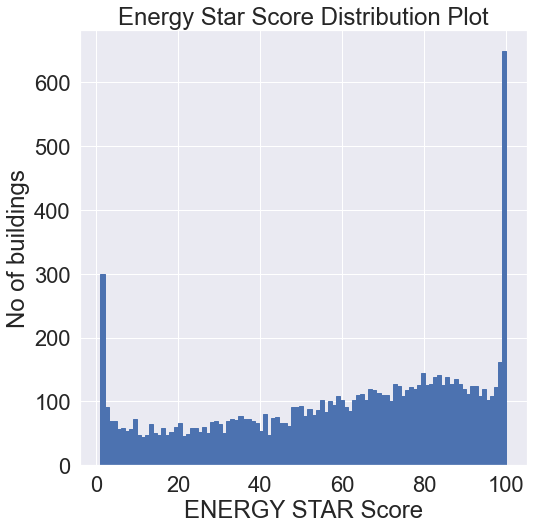

In [125]:
figsize(8, 8)

plt.hist(df['ENERGY STAR Score'].dropna(), bins=100, edgecolor='b')
plt.xlabel('ENERGY STAR Score'); 
plt.ylabel('No of buildings');
plt.title('Energy Star Score Distribution Plot'); 
plt.show()

Energy star score shows flat distribution, except for 100 & 1 score

The Property Type colums has a lot of values, some that appears more often and others less.
will put them together


Text(0.5, 0, 'ENERGY STAR Score')

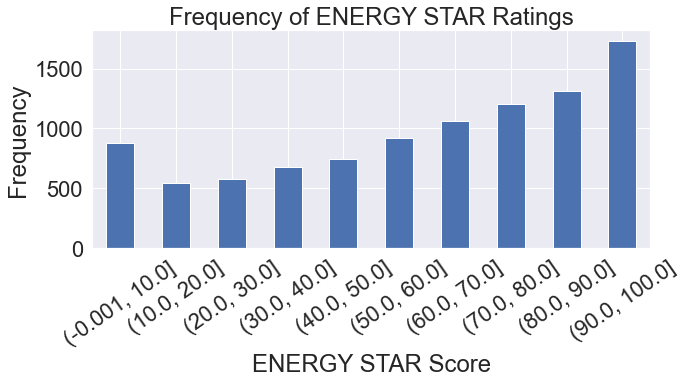

In [126]:
bins = [0,10,20,30,40,50,60,70,80,90,100]

df['ENERGY STAR Score'].value_counts(bins=bins)\
                        .sort_index()\
                        .plot(kind    = 'bar',
                              rot     = 35,
                              figsize = (10,4),
                              title   = 'Frequency of ENERGY STAR Ratings')
plt.ylabel('Frequency')
plt.xlabel('ENERGY STAR Score')

Text(0, 0.5, 'Frequency')

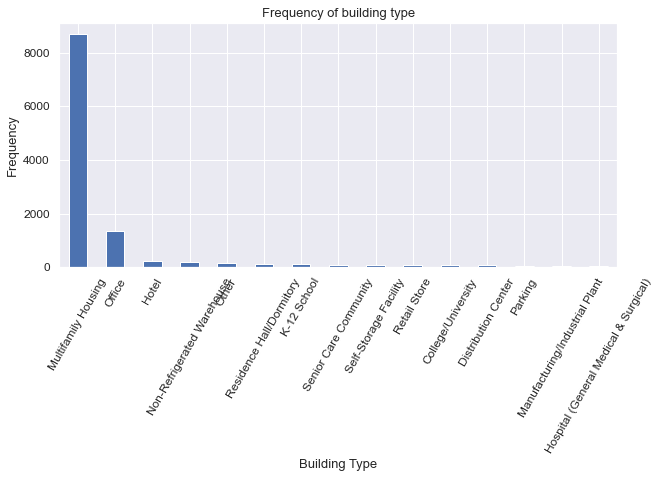

In [127]:
df['Largest Property Use Type'].value_counts()\
                          .head(15)\
                          .plot(kind     = 'bar',
                                figsize  = (10,4.5),
                                fontsize = 12,
                                rot      = 60)
        
plt.title('Frequency of building type', fontsize=13)
plt.xlabel('Building Type', fontsize=13)
plt.ylabel('Frequency', fontsize=13)

In [128]:
df['Largest Property Use Type'].value_counts()

Multifamily Housing                                 8694
Office                                              1364
Hotel                                                227
Non-Refrigerated Warehouse                           202
Other                                                154
Residence Hall/Dormitory                             111
K-12 School                                          104
Senior Care Community                                100
Self-Storage Facility                                 98
Retail Store                                          94
College/University                                    92
Distribution Center                                   68
Parking                                               55
Manufacturing/Industrial Plant                        53
Hospital (General Medical & Surgical)                 48
Medical Office                                        34
Supermarket/Grocery Store                             25
Other - Entertainment/Public As

In [129]:
property_type = {'Multifamily Housing':'Multifamily Housing',  
            'Residence Hall/Dormitory':'Residence Hall/Dormitory',
            'Other - Lodging/Residential':'Residence Hall/Dormitory',
            'Hotel':'Hotel',
            'Adult Education':'College/University',
            'College/University':'College/University',
            'K-12 School':'College/University',
            'Library':'College/University',
            'Vocational School':'College/University',
            'Other - Education':'College/University',
            'Office':'Office',
            'Medical Office':'Office',
            'Financial Office':'Office',
            'Bank Branch':'Office',
            'Distribution Center':'Distribution Center',
            'Self-Storage Facility':'Distribution Center',
            'Wholesale Club/Supercenter':'Distribution Center',
            'Non-Refrigerated Warehouse':'Distribution Center',
            'Fast Food Restaurant':'Food Service',
            'Food Sales':'Food Service',
            'Food Service':'Food Service',
            'Restaurant':'Food Service',
            'Supermarket/Grocery Store':'Food Service',
            'Convenience Store without Gas Station':'Food Service',
            'Other - Restaurant/Bar':'Food Service',
            'Hospital (General Medical & Surgical)':'Senior Care Community',
            'Urgent Care/Clinic/Other Outpatient':'Senior Care Community',
            'Ambulatory Surgical Center':'Senior Care Community',
            'Laboratory':'Senior Care Community',
            'Pre-school/Daycare':'Senior Care Community',
            'Senior Care Community':'Senior Care Community',
            'Outpatient Rehabilitation/Physical Therapy':'Senior Care Community',
            'Retail Store':'Retail Store',
            'Repair Services (Vehicle, Shoe, Locksmith, etc.)':'Retail Store',
            'Mailing Center/Post Office':'Retail Store',
            'Automobile Dealership':'Retail Store',
            'Mailing Center/Post Office':'Retail Store',
            'Personal Services (Health/Beauty, Dry Cleaning...':'Retail Store',
            'Enclosed Mall':'Retail Store',
            'Other - Mall':'Retail Store',
            'Other - Services':'Retail Store',
            'Other - Utility':'Retail Store',
            'Bar/Nightclub':'Recreation',
            'Bowling Alley':'Recreation',
            'Fitness Center/Health Club/Gym':'Recreation',
            'Other - Recreation':'Recreation',
            'Other - Entertainment/Public Assembly':'Recreation',
            'Performing Arts':'Recreation',
            'Social/Meeting Hall':'Recreation',
            'Museum':'Recreation',
            'Worship Facility':'Recreation',
            'Other':'Other',
            'Courthouse':'Other',
            'Other - Public Services':'Other',
            'Swimming Pool':'Other',
            'Parking':'Other',
            'Refrigerated Warehouse':'Other',
            'Data Center':'Other',
            'none':'none'
              }

#### <font color='Green'> As there are too many property types given in dataset, I will convert these into related groups </font>

In [130]:
df['Largest Property Use Type'] = df['Largest Property Use Type'].map(property_type).astype(str)
df['2nd Largest Property Use Type'] = df['2nd Largest Property Use Type'].map(property_type).astype(str)
df['3rd Largest Property Use Type'] = df['3rd Largest Property Use Type'].map(property_type).astype(str)

<AxesSubplot:xlabel='ENERGY STAR Score', ylabel='Largest Property Use Type'>

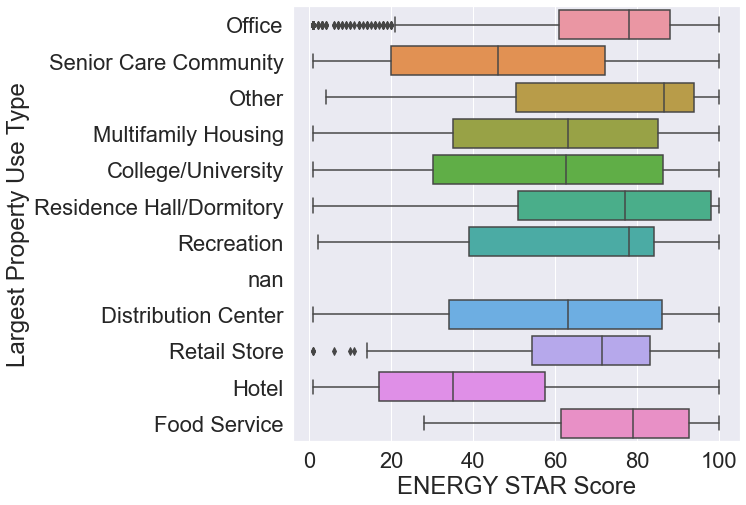

In [131]:
sns.boxplot(df['ENERGY STAR Score'],df['Largest Property Use Type'])

In [132]:
df.columns

Index(['Order', 'Property Id', 'Parent Property Id', 'Postal Code', 'Borough',
       'Primary Property Type - Self Selected', 'Largest Property Use Type',
       '2nd Largest Property Use Type', '3rd Largest Property Use Type',
       'Year Built', 'Number of Buildings - Self-reported', 'Occupancy',
       'Metered Areas (Energy)', 'Metered Areas  (Water)', 'ENERGY STAR Score',
       'Site EUI (kBtu/ft²)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Water Intensity (All Water Sources) (gal/ft²)',
       'Source EUI (kBtu/ft²)', 'Release Date', 'Water Required?',
       'Community Board', 'Council District', 'Census Tract', 'NTA',
       'Largest Property Use Rate', '2nd Property Use Rate',
       '3rd Property Use Rate', 'Direct GHG Emissions Rate', 'Tax Block',
       'Tax Lot'],
      dtype='object')

In [133]:
# drop unwanted columns
column_droplist = ['Metered Areas (Energy)','Metered Areas  (Water)','Release Date','Water Required?','Community Board','Council District','Census Tract','NTA']

df.drop(column_droplist, axis = 1, inplace = True)

In [134]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11746 entries, 0 to 11745
Data columns (total 25 columns):
 #   Column                                                      Non-Null Count  Dtype  
---  ------                                                      --------------  -----  
 0   Order                                                       11746 non-null  int64  
 1   Property Id                                                 11746 non-null  object 
 2   Parent Property Id                                          11746 non-null  object 
 3   Postal Code                                                 11746 non-null  object 
 4   Borough                                                     11746 non-null  object 
 5   Primary Property Type - Self Selected                       11746 non-null  object 
 6   Largest Property Use Type                                   11746 non-null  object 
 7   2nd Largest Property Use Type                               11746 non-null  object 
 

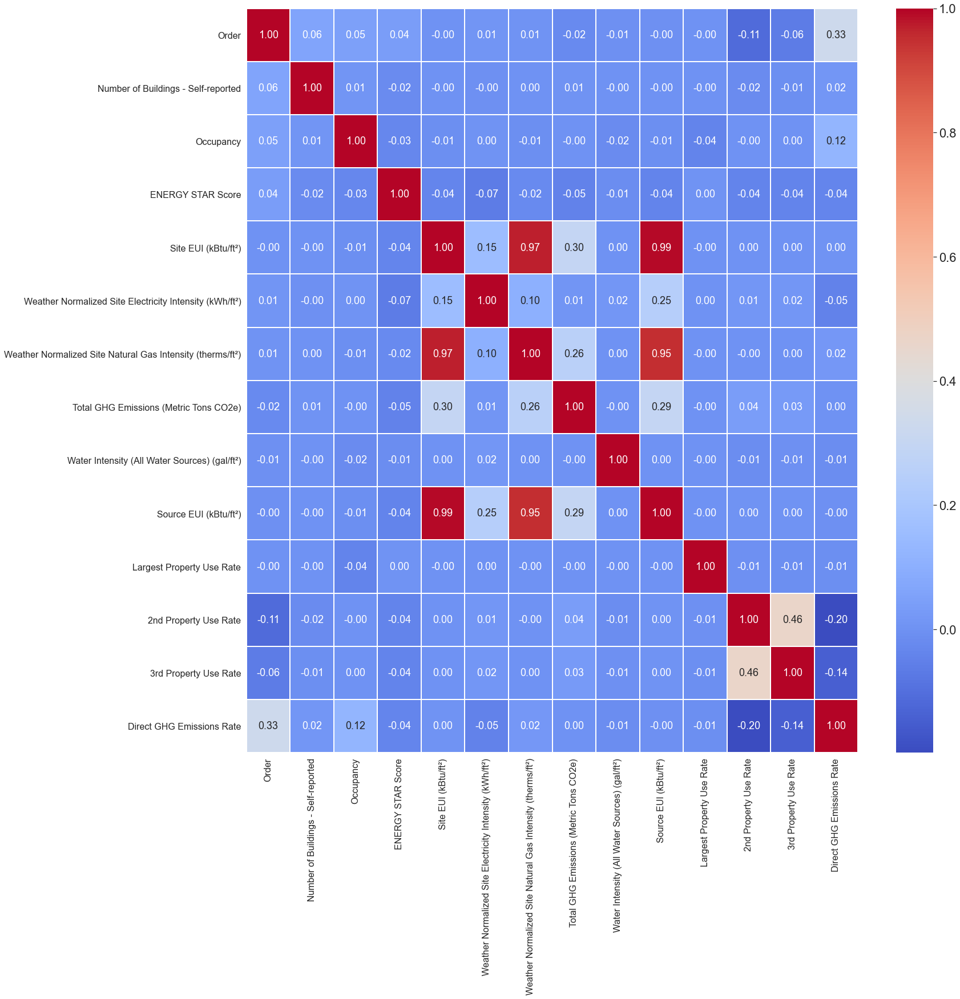

In [135]:
# Calculates the correlation and plot the data in s heatmap
sns.heatmap(df.corr(), annot = True, cmap = 'coolwarm', linewidths = 0.1, annot_kws = {'size':18}, fmt = '.2f')
fig = plt.gcf()
fig.set_size_inches(24,24)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.show()

### <font color='Green'> From above we can conclude that </font>

Source EUI (kBtu/ft²) , Site EUI (kBtu/ft²),  Weather Normalized Site Natural Gas Intensity (therms/ft²)    are highlt correlated,
So we can drop any 2 columns

In [136]:
# Select the numeric columns
df_numeric_col = df.select_dtypes('number')
df_numeric_feat_col = df_numeric_col.drop('ENERGY STAR Score', axis = 1)
ycol = df['ENERGY STAR Score']

df_feat_col = df.select_dtypes('object')
df_feat_col2 = df_feat_col.drop(['Borough', 'Largest Property Use Type'], axis = 1)

# Select the categorical columns
df_cat_col = df[['Borough', 'Largest Property Use Type']]

# One hot encode
df_cat_col = pd.get_dummies(df_cat_col)

# Join the two dataframes using concat
dff = pd.concat([ycol, df_feat_col2, df_numeric_feat_col, df_cat_col], axis = 1)

In [137]:
dff.head()

,ENERGY STAR Score,Property Id,Parent Property Id,Postal Code,Primary Property Type - Self Selected,2nd Largest Property Use Type,3rd Largest Property Use Type,Year Built,Tax Block,Tax Lot,Order,Number of Buildings - Self-reported,Occupancy,Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Total GHG Emissions (Metric Tons CO2e),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Largest Property Use Rate,2nd Property Use Rate,3rd Property Use Rate,Direct GHG Emissions Rate,Borough_1,Borough_2,Borough_3,Borough_4,Borough_5,Borough_nan,Largest Property Use Type_College/University,Largest Property Use Type_Distribution Center,Largest Property Use Type_Food Service,Largest Property Use Type_Hotel,Largest Property Use Type_Multifamily Housing,Largest Property Use Type_Office,Largest Property Use Type_Other,Largest Property Use Type_Recreation,Largest Property Use Type_Residence Hall/Dormitory,Largest Property Use Type_Retail Store,Largest Property Use Type_Senior Care Community,Largest Property Use Type_nan
0,NaN,13286,13286,10017,Office,none,none,1963,01316,0001,1,2,100,305.6,37.8,0.0,6962.2,0.0,619.4,0.385075,0.0,0.0,0.00000,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,55.0,28400,28400,10032,Hospital (General Medical & Surgical),none,none,1969,02138,0040,2,12,100,229.8,24.8,2.4,55870.4,0.0,404.3,1.000000,0.0,0.0,0.91312,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,NaN,4778226,28400,10032,Hospital (General Medical & Surgical),none,none,1924,02138,0030,3,1,100,NaN,0.0,0.0,0.0,0.0,NaN,1.000000,0.0,0.0,0.00000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,NaN,4778267,28400,10032,Hospital (General Medical & Surgical),none,none,1971,02139,0001,4,1,100,NaN,0.0,0.0,0.0,0.0,NaN,1.000000,0.0,0.0,0.00000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,NaN,4778288,28400,10032,Hospital (General Medical & Surgical),none,none,1932,02139,0085,5,1,100,NaN,0.0,0.0,0.0,0.0,NaN,1.000000,0.0,0.0,0.00000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [138]:
# perform label encoding 
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder

le = LabelEncoder()

dff['3rd Largest Property Use Type v1'] = le.fit_transform(dff['3rd Largest Property Use Type'])
dff['2nd Largest Property Use Type v1'] = le.fit_transform(dff['2nd Largest Property Use Type'])
dff['Primary Property Type - Self Selected v1'] = le.fit_transform(dff['Primary Property Type - Self Selected'])
dff['Year Built v1'] = le.fit_transform(dff['Year Built'])
dff['Postal Code v1'] = le.fit_transform(dff['Postal Code'])
dff['Parent Property Id v1'] = le.fit_transform(dff['Parent Property Id'])
dff['Property Id v1'] = le.fit_transform(dff['Property Id'])
dff['Tax Lot v1'] = le.fit_transform(dff['Tax Lot'])
dff['Tax Block v1'] = le.fit_transform(dff['Tax Block'])


In [139]:
# drop label encode columns
label_encoded_columns_to_drop = ['Postal Code','Parent Property Id','Property Id','Tax Lot','Tax Block',
        '3rd Largest Property Use Type','2nd Largest Property Use Type',
        'Primary Property Type - Self Selected','Year Built']

dff = dff.drop(label_encoded_columns_to_drop, axis = 1)

In [140]:
dff1 = dff[dff['ENERGY STAR Score'].notnull()]

In [141]:
# take min max scalar so that we can use regression type algorithms

column_to_scale = ['Order', 'Number of Buildings - Self-reported',
       'Occupancy', 'Site EUI (kBtu/ft²)',
       'Weather Normalized Site Electricity Intensity (kWh/ft²)',
       'Weather Normalized Site Natural Gas Intensity (therms/ft²)',
       'Total GHG Emissions (Metric Tons CO2e)',
       'Water Intensity (All Water Sources) (gal/ft²)',
       'Source EUI (kBtu/ft²)', 'Largest Property Use Rate',
       '2nd Property Use Rate', '3rd Property Use Rate',
       'Direct GHG Emissions Rate', 'Borough_1', 'Borough_2', 'Borough_3',
       'Borough_4', 'Borough_5', 'Borough_nan',
       'Largest Property Use Type_College/University',
       'Largest Property Use Type_Distribution Center',
       'Largest Property Use Type_Food Service',
       'Largest Property Use Type_Hotel',
       'Largest Property Use Type_Multifamily Housing',
       'Largest Property Use Type_Office', 'Largest Property Use Type_Other',
       'Largest Property Use Type_Recreation',
       'Largest Property Use Type_Residence Hall/Dormitory',
       'Largest Property Use Type_Retail Store',
       'Largest Property Use Type_Senior Care Community',
       'Largest Property Use Type_nan', '3rd Largest Property Use Type v1',
       '2nd Largest Property Use Type v1',
       'Primary Property Type - Self Selected v1', 'Year Built v1',
       'Postal Code v1', 'Parent Property Id v1', 'Property Id v1',
       'Tax Lot v1', 'Tax Block v1']

import pandas as pd
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

dff1[column_to_scale] = scaler.fit_transform(dff1[column_to_scale])


#### <font color='Green'> Split dataset </font>

In [142]:
y=dff1['ENERGY STAR Score']
X=dff1.loc[:, ~dff1.columns.isin(['ENERGY STAR Score'])]

#### <font color='Green'> Shuffle dataset & split into train, test dataset </font>

In [143]:
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

X, y = shuffle(X, y)
    
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


### <font color='Green'> Using gradient boost regressor   (If I have converted target variable into class then I shoud have used gradient boosting classifier) </font>

But i'm using regression technique & after prediction I will use mapping 

#### I did hyperparameter tuning, here only using best result parameter

In [144]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error


param = {'n_estimators': 500,
          'max_depth': 5,
          'min_samples_split': 6,
           'min_samples_leaf' : 6,
          'loss': 'lad'}

'''
gradient_boosted=GradientBoostingRegressor(loss='lad', max_depth=5,  
                          max_features=None,
                          min_samples_leaf=6,
                          min_samples_split=6,
                          n_estimators=500)
'''
gradient_boosted=GradientBoostingRegressor(**param)

gradient_boosted.fit(X_train, y_train)
predictions = gradient_boosted.predict(X_test)
mae = mean_absolute_error(y_test, predictions)

print('Gradient Boosted Performance on the test set: MAE = %0.4f' % mae)

Gradient Boosted Performance on the test set: MAE = 8.5150


### Create result dataframe & create predicted enegry score column

In [145]:
df_result = X_test.reset_index()

In [146]:
df_result['Predicted Enegry Score'] = predictions

### Map Predicted Enegry Score column into required format

In [147]:
cond_a = df_result['Predicted Enegry Score'] >= 85
cond_b = (df_result['Predicted Enegry Score'] < 85 ) & ( df_result['Predicted Enegry Score'] >= 70)
cond_c = (df_result['Predicted Enegry Score'] < 70 ) & ( df_result['Predicted Enegry Score'] >= 50)
cond_d = df_result['Predicted Enegry Score'] < 50

df_result.loc[cond_a, 'Predicted Enegry Score1'] = 'A'
df_result.loc[cond_b, 'Predicted Enegry Score1'] = 'B'
df_result.loc[cond_c, 'Predicted Enegry Score1'] = 'C'
df_result.loc[cond_d, 'Predicted Enegry Score1'] = 'D'

In [148]:
df_result

,index,Order,Number of Buildings - Self-reported,Occupancy,Site EUI (kBtu/ft²),Weather Normalized Site Electricity Intensity (kWh/ft²),Weather Normalized Site Natural Gas Intensity (therms/ft²),Total GHG Emissions (Metric Tons CO2e),Water Intensity (All Water Sources) (gal/ft²),Source EUI (kBtu/ft²),Largest Property Use Rate,2nd Property Use Rate,3rd Property Use Rate,Direct GHG Emissions Rate,Borough_1,Borough_2,Borough_3,Borough_4,Borough_5,Borough_nan,Largest Property Use Type_College/University,Largest Property Use Type_Distribution Center,Largest Property Use Type_Food Service,Largest Property Use Type_Hotel,Largest Property Use Type_Multifamily Housing,Largest Property Use Type_Office,Largest Property Use Type_Other,Largest Property Use Type_Recreation,Largest Property Use Type_Residence Hall/Dormitory,Largest Property Use Type_Retail Store,Largest Property Use Type_Senior Care Community,Largest Property Use Type_nan,3rd Largest Property Use Type v1,2nd Largest Property Use Type v1,Primary Property Type - Self Selected v1,Year Built v1,Postal Code v1,Parent Property Id v1,Property Id v1,Tax Lot v1,Tax Block v1,Predicted Enegry Score,Predicted Enegry Score1
0,10524,0.880862,0.006452,1.00,0.000085,0.000509,0.000075,0.000104,0.001851,0.000107,0.000628,0.000000,0.000000,0.559061,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.392157,0.500000,0.880702,1.0,0.250234,0.068750,0.525086,81.135298,B
1,7488,0.604096,0.006452,1.00,0.000097,0.002111,0.000053,0.000372,0.000000,0.000187,0.000628,0.000000,0.000000,0.280276,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.450980,0.442308,0.782456,1.0,0.034653,0.000000,0.050910,80.384527,B
2,7608,0.617304,0.006452,1.00,0.000035,0.000490,0.000021,0.000157,0.000000,0.000055,0.000628,0.000000,0.000000,0.413311,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.431373,0.596154,0.705263,1.0,0.406386,0.141667,0.179292,76.494577,B
3,8154,0.676539,0.006452,0.95,0.000081,0.000886,0.000053,0.000081,0.000000,0.000119,0.000628,0.000000,0.000000,0.451745,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.392157,0.948718,0.666667,1.0,0.894168,0.104167,0.584358,70.169281,B
4,6240,0.500367,0.006452,1.00,0.000119,0.001056,0.000096,0.000104,0.002971,0.000164,0.000628,0.000000,0.000000,0.498593,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.392157,0.801282,0.473684,1.0,0.942103,0.002083,0.533448,30.643857,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1924,9277,0.773331,0.006452,1.00,0.000045,0.002262,0.000000,0.000129,0.004212,0.000134,0.000628,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,0.392157,0.820513,0.722807,1.0,0.320562,0.933333,0.873586,61.022234,C
1925,1241,0.100193,0.006452,0.80,0.000088,0.003544,0.000000,0.002538,0.000708,0.000237,0.000497,0.123448,0.019346,0.004254,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.833333,0.450980,0.685897,0.007018,1.0,0.582546,0.981250,0.126414,74.579756,B
1926,558,0.040291,0.006452,1.00,0.000158,0.000000,0.000000,0.000107,0.000000,0.000202,0.000476,0.075888,0.191128,0.542931,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500000,0.166667,0.392157,0.250000,0.196491,1.0,0.267774,0.018750,0.014019,14.517856,D
1927,11179,0.937362,0.006452,1.00,0.000036,0.001093,0.000011,0.000039,0.000360,0.000082,0.000628,0.000000,0.000000,0.177784,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.500000,0.470588,0.923077,0.943860,1.0,0.729076,0.933333,0.915888,93.954477,A


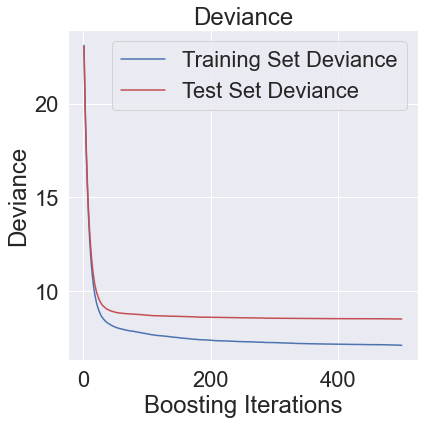

In [149]:
test_score = np.zeros((param["n_estimators"],), dtype=np.float64)
for i, y_pred in enumerate(gradient_boosted.staged_predict(X_test)):
    test_score[i] = gradient_boosted.loss_(y_test, y_pred)

fig = plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1)
plt.title("Deviance")
plt.plot(
    np.arange(param["n_estimators"]) + 1,
    gradient_boosted.train_score_,
    "b-",
    label="Training Set Deviance",
)
plt.plot(
    np.arange(param["n_estimators"]) + 1, test_score, "r-", label="Test Set Deviance"
)
plt.legend(loc="upper right")
plt.xlabel("Boosting Iterations")
plt.ylabel("Deviance")
fig.tight_layout()
plt.show()


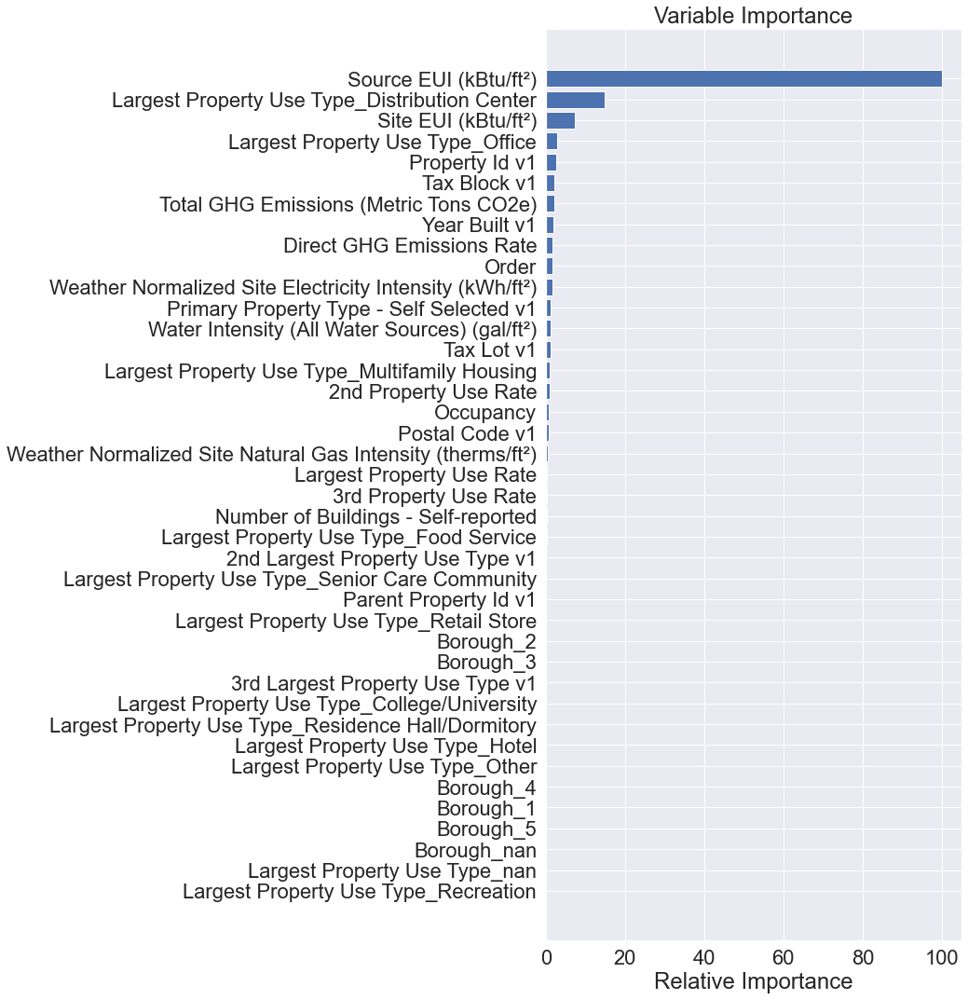

In [150]:
feature_importance = gradient_boosted.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
# plt.subplot(1, 2, 2)
plt.figure(figsize=(8, 18))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X_train.keys()[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

From above we can see that important feature with there relative importance in modelling prediction